## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## 1. Compute the camera calibration using chessboard images

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt

# Visualizations will be shown in the notebook.
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

cali_ret, cali_mtx, cali_dist, cali_rvecs, cali_tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)


## 2. Apply a distortion correction to raw images

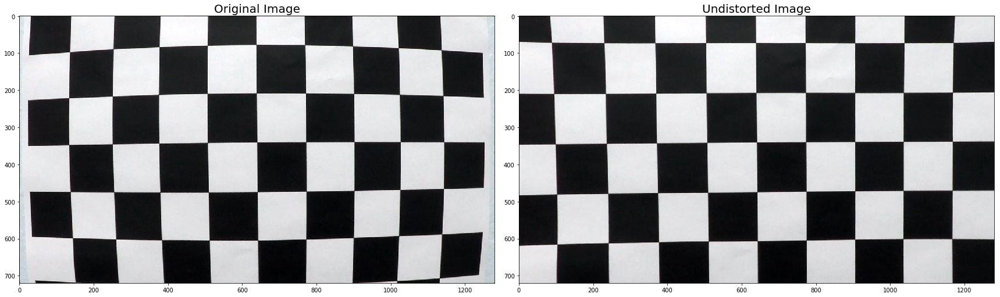

In [2]:

orig_image=cv2.imread('camera_cal/calibration1.jpg')
undist_image = cv2.undistort(orig_image, cali_mtx, cali_dist, None, cali_mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(orig_image)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(undist_image)
ax2.set_title('Undistorted Image', fontsize=20)


#### Apply a distortion correction to test images

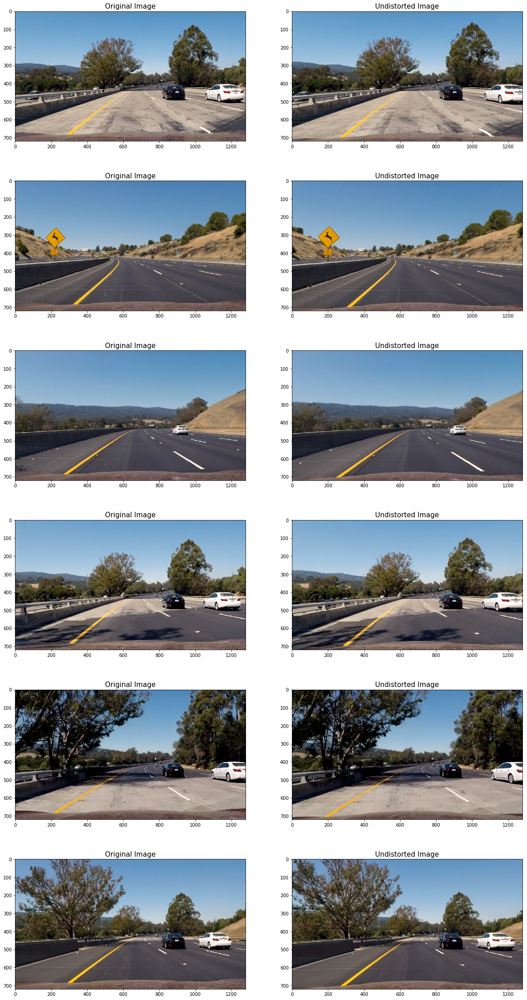

In [3]:
# Make a list of test images
test_images = glob.glob('test_images/test*.jpg')

undist_images = []

fig, ax = plt.subplots(len(test_images),2, figsize=(20, 40))
ax = ax.ravel()
i = 0;
for fname in test_images:
    orig_img=cv2.imread(fname)
    undist_img = cv2.undistort(orig_img, cali_mtx, cali_dist, None, cali_mtx)
    undist_images.append(undist_img)
    ax[i].imshow(cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB))
    ax[i].set_title('Original Image', fontsize=15)
    ax[i+1].imshow(cv2.cvtColor(undist_img, cv2.COLOR_BGR2RGB))
    ax[i+1].set_title('Undistorted Image', fontsize=15)
    i = i+2

## 3. Use color transforms, gradients, etc., to create a thresholded binary image

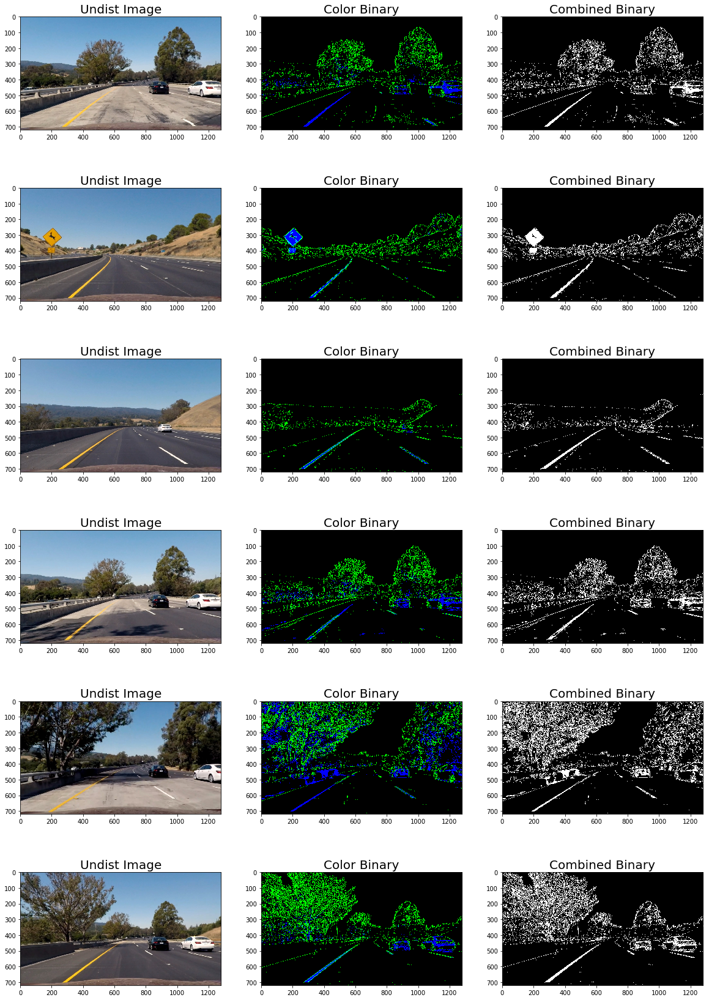

In [4]:
def thresholded_binary_pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HLS color space and separate the S channel
    # Note: img is the undistorted image
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    s_channel = hls[:,:,2]

    # Grayscale image
    # NOTE: we already saw that standard grayscaling lost color information for the lane lines
    # Explore gradients in other colors spaces / color channels to see what might work better
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    thresh_min = sx_thresh[0]
    thresh_max = sx_thresh[1]
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Threshold color channel
    s_thresh_min = s_thresh[0]
    s_thresh_max = s_thresh[1]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1

    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1

    return color_binary, combined_binary

# test 'thresholded_binary_pipeline'
fig, ax = plt.subplots(len(undist_images),3, figsize=(20, 30))
ax = ax.ravel()
i = 0;
for img in undist_images:
    color_binary, combined_binary = thresholded_binary_pipeline(img)
    ax[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax[i].set_title('Undist Image', fontsize=20)
    ax[i+1].imshow(color_binary)
    ax[i+1].set_title('Color Binary', fontsize=20)
    ax[i+2].imshow(combined_binary, cmap='gray')
    ax[i+2].set_title('Combined Binary', fontsize=20)
    i = i+3
    

## 4. Apply a perspective transform to rectify binary image ("birds-eye view")

In [6]:
%matplotlib qt

import matplotlib.image as mpimg

# manually mark src points from straight_lines1.jpg
straight1_img = mpimg.imread('test_images/straight_lines1.jpg')
undist_straight1_img = cv2.undistort(straight1_img, cali_mtx, cali_dist, None, cali_mtx)
plt.imshow(undist_straight1_img)

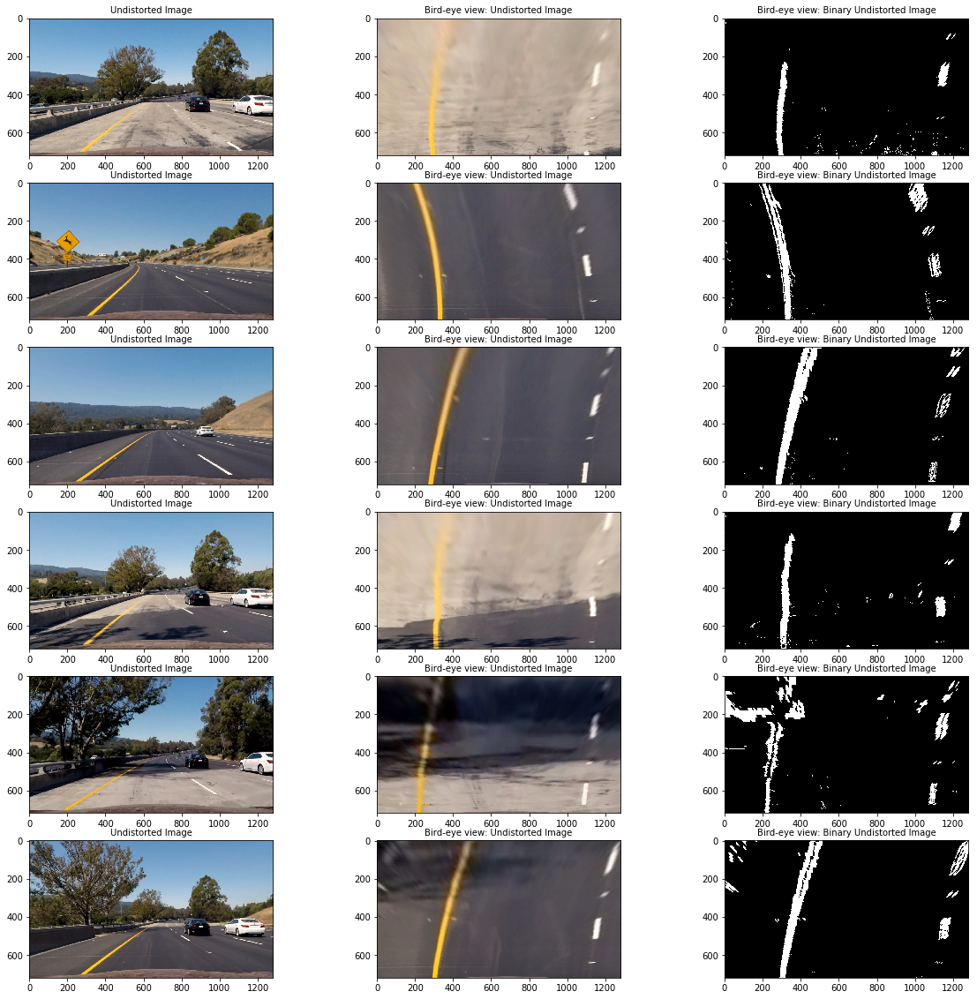

In [7]:
# manually marked points
src_pts = np.float32([[255,685],[1054,685],[704,461], [579,461]])
dst_pts = np.float32([[255,719],[1054,719],[1054,0],[255,0]])

img_size = (straight1_img.shape[1],straight1_img.shape[0])
# calculate the perspective transform matrix
warp_M = cv2.getPerspectiveTransform(src_pts, dst_pts)
# calculate the rev. of perspective transform matrix
warp_MinM = cv2.getPerspectiveTransform(dst_pts, src_pts)

# demo the perspective transform results
%matplotlib inline
fig, ax = plt.subplots(len(test_images),3, figsize=(20, 20))
ax = ax.ravel()
i = 0
for undist_img in undist_images:
    warped_undist_img = cv2.warpPerspective(undist_img, warp_M, img_size, flags=cv2.INTER_LINEAR)
    color_binary, combined_binary = thresholded_binary_pipeline(undist_img)
    warped_undist_binary_img = cv2.warpPerspective(combined_binary, warp_M, img_size, flags=cv2.INTER_LINEAR)
    ax[i].imshow(cv2.cvtColor(undist_img, cv2.COLOR_BGR2RGB))
    ax[i].set_title('Undistorted Image', fontsize=10)
    ax[i+1].imshow(cv2.cvtColor(warped_undist_img, cv2.COLOR_BGR2RGB))
    ax[i+1].set_title('Bird-eye view: Undistorted Image', fontsize=10)
    ax[i+2].imshow(warped_undist_binary_img, cmap='gray')
    ax[i+2].set_title('Bird-eye view: Binary Undistorted Image', fontsize=10)
    i = i+3    
    

## 5. Detect lane pixels and fit to find the lane boundary

In [8]:
# Define conversions in x and y from pixels space to meters

ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
def curverad(x, y, y_eval):
    # Fit new polynomials to x,y in world space
    fit_cr = np.polyfit(y*ym_per_pix, x*xm_per_pix, 2)
    # Calculate the new radii of curvature
    curverad = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
    # Now our radius of curvature is in meters
    return curverad

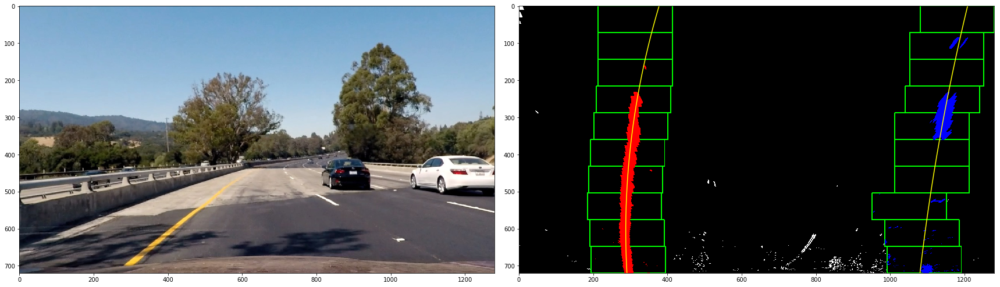

In [9]:
def sliding_window_polyfit(binary_warped, ax=None): 
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 10
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    if ax is not None:
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        if ax is not None:
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2)
            
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low)&(nonzeroy < win_y_high)&(nonzerox >= win_xleft_low)&(nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low)&(nonzeroy < win_y_high)&(nonzerox >= win_xright_low)&(nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    y_eval = binary_warped.shape[0]-1
    left_curverad = curverad(leftx, lefty, y_eval)
    right_curverad = curverad(rightx, righty, y_eval)
    
    if ax is not None:
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        ax.imshow(out_img)
        ax.plot(left_fitx, ploty, color='yellow')
        ax.plot(right_fitx, ploty, color='yellow')
    return left_fit, right_fit, left_curverad, right_curverad

# test 'sliding_window_polyfit'
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(undist_images[3], cv2.COLOR_BGR2RGB))
color_binary, combined_binary = thresholded_binary_pipeline(undist_images[0])
warped_undist_binary_img = cv2.warpPerspective(combined_binary, warp_M, img_size, flags=cv2.INTER_LINEAR)
l_fit, r_fit, l_curverad, r_curverad = sliding_window_polyfit(warped_undist_binary_img, ax2)

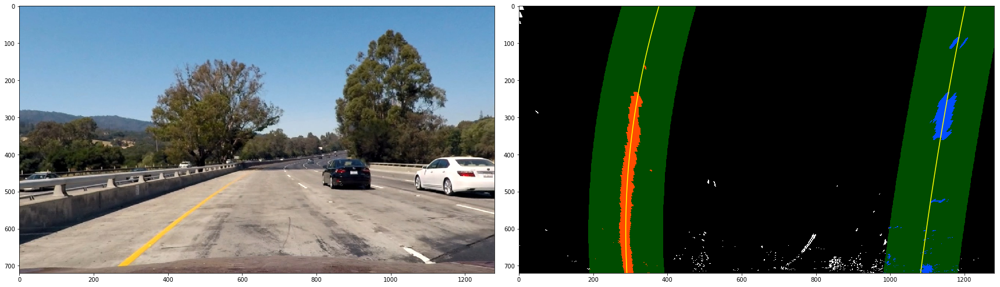

In [10]:
def incremental_polyfit(binary_warped, left_fit, right_fit, ax=None):
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                                   left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                                left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                        right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    y_eval = binary_warped.shape[0]-1
    left_curverad = curverad(leftx, lefty, y_eval)
    right_curverad = curverad(rightx, righty, y_eval)
    
    if ax is not None:
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        # Create an image to draw on and an image to show the selection window
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        window_img = np.zeros_like(out_img)
        # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
        ax.imshow(result)
        ax.plot(left_fitx, ploty, color='yellow')
        ax.plot(right_fitx, ploty, color='yellow')
    return left_fit, right_fit, left_curverad, right_curverad

# test 'incremental_polyfit'
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(cv2.cvtColor(undist_images[0], cv2.COLOR_BGR2RGB))
color_binary, combined_binary = thresholded_binary_pipeline(undist_images[0])
warped_undist_binary_img = cv2.warpPerspective(combined_binary, warp_M, img_size, flags=cv2.INTER_LINEAR)
l_fit, r_fit, l_curverad, r_curverad = incremental_polyfit(warped_undist_binary_img, l_fit, r_fit, ax2)

In [11]:
def draw_image(img, left_fit, right_fit, avg_curverad):
    if left_fit is None or right_fit is None:
        print("should not happen")
        return img
    # Generate x and y values for plotting
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    left_to_center = ((left_fitx[-1]+right_fitx[-1])/2-img.shape[1]/2)*xm_per_pix

    warp_zero = np.zeros((img.shape[0],img.shape[1])).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    # warp back the image
    newwarp = cv2.warpPerspective(color_warp, warp_MinM, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    result = cv2.putText(result,'pos: %.2fm left to center' % left_to_center, (5,50), cv2.FONT_HERSHEY_SIMPLEX, 1.5,(255,0,0),2,cv2.LINE_AA)
    result = cv2.putText(result,'curverad: %4dm' % avg_curverad,(5,100), cv2.FONT_HERSHEY_SIMPLEX, 1.5,(255,0,0),2,cv2.LINE_AA)
    return result

In [12]:

import heapq   
def process_image(img):
    undist_img = cv2.undistort(img, cali_mtx, cali_dist, None, cali_mtx)
    color_binary, combined_binary = thresholded_binary_pipeline(undist_img)
    warped_undist_binary_img = cv2.warpPerspective(combined_binary, warp_M, img_size, flags=cv2.INTER_LINEAR)

    if l_line.best_fit is None or r_line.best_fit is None:
        l_line.sliding_count += 1
        # do complete sliding window polyfit, if best_fit is not set
        l_fit, r_fit, l_curverad, r_curverad = sliding_window_polyfit(warped_undist_binary_img)
    else:
        l_line.incremental_count += 1
        l_fit, r_fit, l_curverad, r_curverad = incremental_polyfit(warped_undist_binary_img, l_line.best_fit, r_line.best_fit)
    
    # sanity check
    good_fit = True
    h = np.linspace(0, img.shape[0]-1, img.shape[0])
    l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
    r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
    x_int_diff = abs(r_fit_x_int-l_fit_x_int)
    # a. Checking that they are separated by approximately the right distance horizontally
    if abs(800 - x_int_diff[-1]) > 200:
        good_fit = False
    # b. Checking that they are roughly parallel
    if abs(np.mean(heapq.nlargest(20,x_int_diff)) - np.mean(heapq.nsmallest(20,x_int_diff))) > 100:
        good_fit = False

    if good_fit:
        # add the fit to the current fit list
        l_line.goot_fit_count += 1
        l_line.add_fit(l_fit, l_curverad)
        r_line.add_fit(r_fit, r_curverad)
    else:
        l_line.add_fit(None, None)
        r_line.add_fit(None, None)
        
    # use the best_fit, if exists, to draw line
    if l_line.best_fit is not None and r_line.best_fit is not None:
        l_fit = l_line.best_fit
        r_fit = r_line.best_fit
        l_curverad = l_line.mean_curverad
        r_curverad = r_line.mean_curverad

    avg_curverad = (l_curverad+r_curverad)/2
    output_img = draw_image(undist_img, l_fit, r_fit, avg_curverad)
    return output_img

In [13]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        self.best_fit = None  
        #radius of curvature of the line in meter
        self.radius_of_curvature = [] 
        self.mean_curverad = None
        self.sliding_count = 0
        self.incremental_count = 0
        self.goot_fit_count=0
    
    def add_fit(self, fit, curverad):
        # add a found fit to the line, up to 5
        if fit is not None:
            self.current_fit.append(fit)
            self.radius_of_curvature.append(curverad)
            if len(self.current_fit) > 5:
                # throw out old fits, keep newest n
                self.current_fit = self.current_fit[len(self.current_fit)-5:]
                self.radius_of_curvature = self.radius_of_curvature[len(self.radius_of_curvature)-5:]
            self.best_fit = np.average(self.current_fit, axis=0)
            self.mean_curverad = np.average(self.radius_of_curvature, axis=0)
        # or remove one from the history, if not found
        else:
            if len(self.current_fit) > 0:
                # throw out oldest fit
                self.current_fit = self.current_fit[1:]
                self.radius_of_curvature = self.radius_of_curvature[1:]
            if len(self.current_fit) > 0:
                # if there are still any fits in the queue, best_fit is their average
                self.best_fit = np.average(self.current_fit, axis=0)
                self.mean_curverad = np.average(self.radius_of_curvature, axis=0)
            else:
                self.best_fit = None
                self.mean_curverad = None



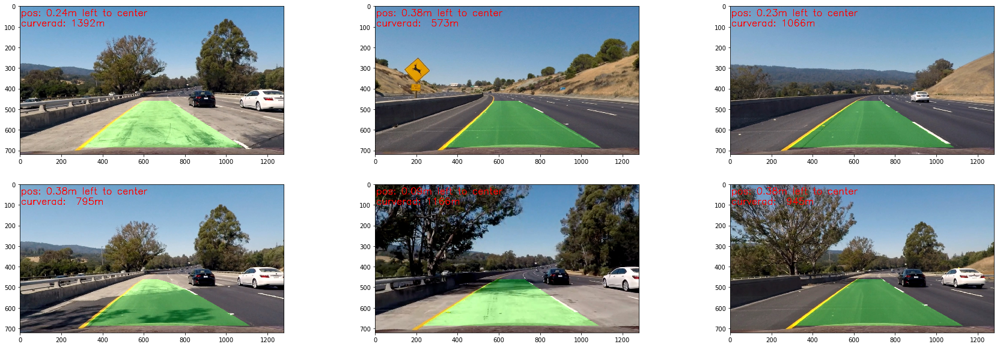

In [14]:

%matplotlib inline
fig, ax = plt.subplots(2,3, figsize=(30, 10))
ax = ax.ravel()
i=0
for fname in test_images:
    test_img = mpimg.imread(fname)
    l_line = Line()
    r_line = Line()
    output_img = process_image(test_img)
    ax[i].imshow(output_img)
    i+=1

In [15]:
from moviepy.editor import VideoFileClip
l_line = Line()
r_line = Line()


clip = VideoFileClip('project_video.mp4')
output_clip = clip.fl_image(process_image)
video_output = 'output_images/project_output.mp4'
%time output_clip.write_videofile(video_output, audio=False)
print(l_line.sliding_count)
print(l_line.incremental_count)
print(l_line.goot_fit_count)

[MoviePy] >>>> Building video output_images/project_output.mp4
[MoviePy] Writing video output_images/project_output.mp4


100%|█████████▉| 1260/1261 [02:24<00:00,  8.23it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/project_output.mp4 

CPU times: user 3min 13s, sys: 33.5 s, total: 3min 46s
Wall time: 2min 25s
23
1238
1190


In [16]:
from IPython.display import HTML
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))